In [1]:
# standard modules
import os
import math
import random
from datetime import datetime

# myself modules
from config import setting
from module import const
from module import image_loader  # get_train_transform, LoadDataSet
from module import machine_learning_model  # UNet
from module import machine_learning_metrics  # DiceBCELoss, DiceLoss, IoU

import torch

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

const.CHECKPOINT_PATH_UNet = setting.const.CHECKPOINT_PATH + "/UNet"

config directory has been initialized as a package
module directory has been initialized as a package


In [2]:
const.IMG_HEIGHT = 256
const.IMG_WIDTH = 256

const.NUM_EPOCHS = 300
# const.NUM_EPOCHS = 10

In [3]:
# データセットを確認する
train_dataset = image_loader.LoadDataSet(
    setting.const.TRAIN_PATH,
    const.IMG_HEIGHT,
    const.IMG_WIDTH,
    transform=image_loader.get_train_transform(const.IMG_HEIGHT, const.IMG_WIDTH),
)

# 辞書型のときに要素を取得するマジックメソッド. 以下と同じ意味
# image, mask = train_dataset.__getitem__(0)
image, mask = train_dataset[0]
print(image.shape)
print(mask.shape)

# Print total number of unique images.
# フォルダーの長さを表示. 以下と同じ意味
train_dataset.__len__()
print(len(train_dataset))

torch.Size([3, 256, 256])
torch.Size([256, 256, 1])
60


[53, 19, 21]


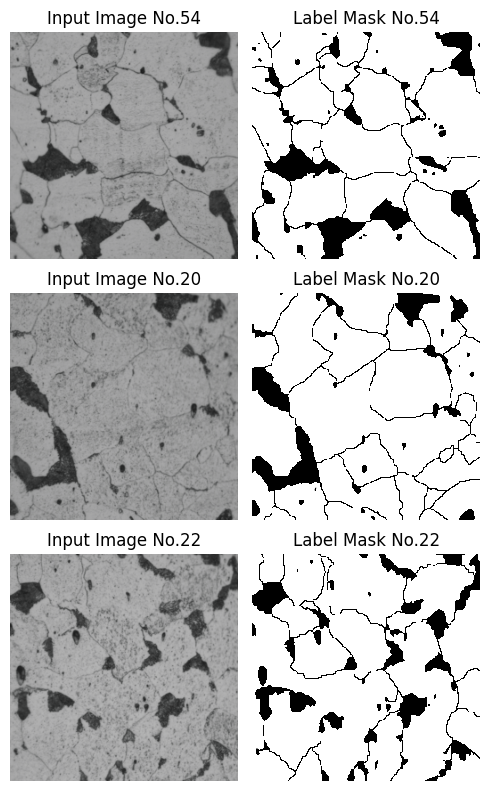

In [4]:
def format_image(img):
    img = np.array(np.transpose(img, (1, 2, 0)))
    # 下は画像拡張での正規化を元に戻しています
    mean = np.array((0.485, 0.456, 0.406))
    std = np.array((0.229, 0.224, 0.225))
    img = std * img + mean
    img = img * 255
    img = img.astype(np.uint8)
    return img


def format_mask(mask):
    mask = np.squeeze(np.transpose(mask, (1, 2, 0)))
    # TODO:なぜかLoadDataSetで反転する
    mask = np.rot90(mask, k=3)
    mask = np.flip(mask, axis=1)
    return mask


def visualize_dataset(n_images, num_range, predict=None):
    # TODO:表示時に水平・垂直クリップがかるからかからないようにする(Predictedのほうも)
    images = random.sample(range(0, num_range), n_images)
    figure, ax = plt.subplots(nrows=len(images), ncols=2, figsize=(5, 8))
    print(images)
    for i in range(0, len(images)):
        img_no = images[i]
        image, mask = train_dataset[i]
        image = format_image(image)
        mask = format_mask(mask)
        ax[i, 0].imshow(image)
        ax[i, 1].imshow(mask, interpolation="nearest", cmap="gray")
        ax[i, 0].set_title(f"Input Image No.{img_no+1}")
        ax[i, 1].set_title(f"Label Mask No.{img_no+1}")
        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
    plt.tight_layout()
    plt.show()


num_range = len(train_dataset)
visualize_dataset(3, num_range)

In [5]:
split_ratio = 0.25
train_size = int(np.round(train_dataset.__len__() * (1 - split_ratio), 0))
valid_size = int(np.round(train_dataset.__len__() * split_ratio, 0))
train_data, valid_data = random_split(train_dataset, [train_size, valid_size])
train_loader = DataLoader(dataset=train_data, batch_size=10, shuffle=True)
val_loader = DataLoader(dataset=valid_data, batch_size=10)

print("Length of train data: {}".format(len(train_data)))
print("Length of validation data: {}".format(len(valid_data)))

Length of train data: 45
Length of validation data: 15


In [6]:
# <---------------各インスタンス作成---------------------->
model = machine_learning_model.UNet(3, 1).cuda()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = machine_learning_metrics.DiceLoss()
accuracy_metric = machine_learning_metrics.IoU()

valid_loss_min = np.Inf

best_model_file = "/best_model.pth"

total_train_loss = []
total_train_score = []
total_valid_loss = []
total_valid_score = []

losses_value = 0
for epoch in range(const.NUM_EPOCHS):
    # <---------------トレーニング---------------------->
    train_loss = []
    train_score = []
    valid_loss = []
    valid_score = []
    pbar = tqdm(train_loader, desc="description")
    for x_train, y_train in pbar:
        x_train = torch.autograd.Variable(x_train).cuda()
        y_train = torch.autograd.Variable(y_train).cuda()
        optimizer.zero_grad()
        output = model(x_train)
        ## 損失計算
        loss = criterion(output, y_train)
        losses_value = loss.item()
        ## 精度評価
        score = accuracy_metric(output, y_train)
        loss.backward()
        optimizer.step()
        train_loss.append(losses_value)
        train_score.append(score.item())
        pbar.set_description(f"Epoch: {epoch+1}, loss: {losses_value}, IoU: {score}")
    # <---------------評価---------------------->
    with torch.no_grad():
        for image, mask in val_loader:
            image = torch.autograd.Variable(image).cuda()
            mask = torch.autograd.Variable(mask).cuda()
            output = model(image)
            ## 損失計算
            loss = criterion(output, mask)
            losses_value = loss.item()
            ## 精度評価
            score = accuracy_metric(output, mask)
            valid_loss.append(losses_value)
            valid_score.append(score.item())

    total_train_loss.append(np.mean(train_loss))
    total_train_score.append(np.mean(train_score))
    total_valid_loss.append(np.mean(valid_loss))
    total_valid_score.append(np.mean(valid_score))
    print(f"Train Loss: {total_train_loss[-1]}, Train IOU: {total_train_score[-1]}")
    print(f"Valid Loss: {total_valid_loss[-1]}, Valid IOU: {total_valid_score[-1]}")

    checkpoint = {
        "epoch": epoch + 1,
        "valid_loss_min": total_valid_loss[-1],
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }

    ## 容量をとるので必要になったら保存する
    # checkpoint_file = "/checkpoint_{}_weight.pth".format(epoch+1)
    # checkpointの保存
    # torch.save(checkpoint, CHECKPOINT_PATH_UNet + checkpoint_file)

    # 評価データにおいて最高精度のモデルのcheckpointの保存
    if total_valid_loss[-1] <= valid_loss_min:
        print(
            "Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...".format(
                valid_loss_min, total_valid_loss[-1]
            )
        )
        torch.save(checkpoint, const.CHECKPOINT_PATH_UNet + best_model_file)
        valid_loss_min = total_valid_loss[-1]

    print("")

Epoch: 1, loss: 0.07242931252576779, IoU: 0.8649250387687794: 100%|█| 5/5 [00:02<00:00,  1.9


Train Loss: 0.16350743744592905, Train IOU: 0.739652904869853
Valid Loss: 0.08686854608499467, Valid IOU: 0.8420178414779773
Validation loss decreased (inf --> 0.086869).  Saving model ...



Epoch: 2, loss: 0.03945289140154562, IoU: 0.9240893113124746: 100%|█| 5/5 [00:01<00:00,  4.9


Train Loss: 0.0592799472503968, Train IOU: 0.8882598759985404
Valid Loss: 0.05926734126318456, Valid IOU: 0.8888478044186221
Validation loss decreased (0.086869 --> 0.059267).  Saving model ...



Epoch: 3, loss: 0.046242887844636704, IoU: 0.9116022237564335: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.048646247248259965, Train IOU: 0.9072529576557748
Valid Loss: 0.06661401941900186, Valid IOU: 0.876654390376227



Epoch: 4, loss: 0.04431421031433824, IoU: 0.9151326105063486: 100%|█| 5/5 [00:00<00:00,  5.1


Train Loss: 0.04707646062099695, Train IOU: 0.9101535491619174
Valid Loss: 0.056022962443838475, Valid IOU: 0.894472135408942
Validation loss decreased (0.059267 --> 0.056023).  Saving model ...



Epoch: 5, loss: 0.05700332343999459, IoU: 0.8921418737245146: 100%|█| 5/5 [00:00<00:00,  5.2


Train Loss: 0.046543999305670235, Train IOU: 0.9111169602265926
Valid Loss: 0.06627083974791254, Valid IOU: 0.8774013359323141



Epoch: 6, loss: 0.0633058593604352, IoU: 0.8809265903020849: 100%|█| 5/5 [00:00<00:00,  5.31


Train Loss: 0.05205779309519774, Train IOU: 0.9013999411473395
Valid Loss: 0.06616884823302172, Valid IOU: 0.8774803452004862



Epoch: 7, loss: 0.03508718059461646, IoU: 0.9322045520626996: 100%|█| 5/5 [00:01<00:00,  4.7


Train Loss: 0.04705392167660962, Train IOU: 0.9104246354219081
Valid Loss: 0.0535915354806602, Valid IOU: 0.8986177344279991
Validation loss decreased (0.056023 --> 0.053592).  Saving model ...



Epoch: 8, loss: 0.03826638270285143, IoU: 0.9262881243807427: 100%|█| 5/5 [00:00<00:00,  5.1


Train Loss: 0.04311365361453674, Train IOU: 0.9174114797227665
Valid Loss: 0.05098782785144079, Valid IOU: 0.9034431725836353
Validation loss decreased (0.053592 --> 0.050988).  Saving model ...



Epoch: 9, loss: 0.033169330077359005, IoU: 0.9357912429293325: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03831590904817115, Train IOU: 0.9263356830330555
Valid Loss: 0.0573562613115941, Valid IOU: 0.892465894873637



Epoch: 10, loss: 0.05080608794647534, IoU: 0.9033009211304689: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.044460900473617546, Train IOU: 0.9149394549281539
Valid Loss: 0.04541748984426003, Valid IOU: 0.9133523765156438
Validation loss decreased (0.050988 --> 0.045417).  Saving model ...



Epoch: 11, loss: 0.03562583610200942, IoU: 0.9311995725098788: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.045451778849992054, Train IOU: 0.9135734047490274
Valid Loss: 0.050456172453035075, Valid IOU: 0.9044438932692117



Epoch: 12, loss: 0.046256229960372264, IoU: 0.9115778608303833: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03822036947853853, Train IOU: 0.9264700527448086
Valid Loss: 0.0450733478833128, Valid IOU: 0.9139747660973698
Validation loss decreased (0.045417 --> 0.045073).  Saving model ...



Epoch: 13, loss: 0.03307139579025786, IoU: 0.9359747810590349: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03599604811327295, Train IOU: 0.930517983538504
Valid Loss: 0.04436325923846446, Valid IOU: 0.9152852799834047
Validation loss decreased (0.045073 --> 0.044363).  Saving model ...



Epoch: 14, loss: 0.053495449623485514, IoU: 0.8984422082741247: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.04075190964923725, Train IOU: 0.9217755092914741
Valid Loss: 0.049809276114919476, Valid IOU: 0.9056599735794173



Epoch: 15, loss: 0.03533876982264461, IoU: 0.9317350789935701: 100%|█| 5/5 [00:01<00:00,  2.


Train Loss: 0.034017702286947095, Train IOU: 0.9342114730276763
Valid Loss: 0.04201660864055645, Valid IOU: 0.9194566013941454
Validation loss decreased (0.044363 --> 0.042017).  Saving model ...



Epoch: 16, loss: 0.03378210161275608, IoU: 0.9346437737647061: 100%|█| 5/5 [00:01<00:00,  3.


Train Loss: 0.037527006499756224, Train IOU: 0.9277156642796746
Valid Loss: 0.051481637971179384, Valid IOU: 0.9026800853072136



Epoch: 17, loss: 0.05178539610068289, IoU: 0.9015287779786975: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.037640363408170764, Train IOU: 0.9275435409820723
Valid Loss: 0.05105000431907386, Valid IOU: 0.9034954824951917



Epoch: 18, loss: 0.030571067666847695, IoU: 0.9406716996786211: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.036019607717868315, Train IOU: 0.930495642699188
Valid Loss: 0.03804255108291443, Valid IOU: 0.9267461205058207
Validation loss decreased (0.042017 --> 0.038043).  Saving model ...



Epoch: 19, loss: 0.04082276152798192, IoU: 0.9215569764613142: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.03442478344147355, Train IOU: 0.9334733818427219
Valid Loss: 0.05399923944271401, Valid IOU: 0.8983853428497451



Epoch: 20, loss: 0.043023385270148706, IoU: 0.9175026970854601: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.035848301580799255, Train IOU: 0.9308121092944217
Valid Loss: 0.050949761646923775, Valid IOU: 0.903707482940499



Epoch: 21, loss: 0.037392741960282416, IoU: 0.9279103390104145: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03599845265260495, Train IOU: 0.9305875684228738
Valid Loss: 0.04987104366305678, Valid IOU: 0.9056420722171137



Epoch: 22, loss: 0.03779924336771889, IoU: 0.9271551186293574: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03348499682793697, Train IOU: 0.935215156242888
Valid Loss: 0.04070419385989976, Valid IOU: 0.9219168430496272



Epoch: 23, loss: 0.05556566477379454, IoU: 0.8947188633748868: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04325873934031708, Train IOU: 0.9172427378174616
Valid Loss: 0.042550117902157625, Valid IOU: 0.9186317924540015



Epoch: 24, loss: 0.0419497799091193, IoU: 0.9194784732654919: 100%|█| 5/5 [00:00<00:00,  5.2


Train Loss: 0.03398082920191472, Train IOU: 0.9343103760230722
Valid Loss: 0.04014969384060857, Valid IOU: 0.9229605490888679



Epoch: 25, loss: 0.03309176025440563, IoU: 0.9359366356537846: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.033742359598649484, Train IOU: 0.934740039323777
Valid Loss: 0.04398910287462876, Valid IOU: 0.9160752557683475



Epoch: 26, loss: 0.033304239109757994, IoU: 0.9355385192479121: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03299633621620455, Train IOU: 0.9361224335591048
Valid Loss: 0.04573935975582516, Valid IOU: 0.9129543941985161



Epoch: 27, loss: 0.04159966051449482, IoU: 0.9201237580267082: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03324948968823571, Train IOU: 0.935679528430844
Valid Loss: 0.044904304153695396, Valid IOU: 0.9144702208559816



Epoch: 28, loss: 0.0383402555405532, IoU: 0.9261511089406879: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.03235202106102073, Train IOU: 0.937355869849412
Valid Loss: 0.03628188084140027, Valid IOU: 0.9300051452108316
Validation loss decreased (0.038043 --> 0.036282).  Saving model ...



Epoch: 29, loss: 0.037806929174591164, IoU: 0.92714089420319: 100%|█| 5/5 [00:00<00:00,  5.2


Train Loss: 0.03195609744187504, Train IOU: 0.9380839381299803
Valid Loss: 0.03718393433247197, Valid IOU: 0.9283960169016083



Epoch: 30, loss: 0.039334350353345315, IoU: 0.9243087630870687: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.03272132051577359, Train IOU: 0.9366525737584261
Valid Loss: 0.03994735765458529, Valid IOU: 0.9233500398208294



Epoch: 31, loss: 0.02743754217845762, IoU: 0.9465904694796663: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03069746812507137, Train IOU: 0.9404433744497368
Valid Loss: 0.0364614746181785, Valid IOU: 0.9297039265028663



Epoch: 32, loss: 0.026824119229417853, IoU: 0.9477533254590517: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.031951824185426546, Train IOU: 0.9381090081964159
Valid Loss: 0.03912472763182934, Valid IOU: 0.9248665508865086



Epoch: 33, loss: 0.0303242461634462, IoU: 0.9411366862600072: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.030737384417776892, Train IOU: 0.940365807446636
Valid Loss: 0.046445261470006494, Valid IOU: 0.9117924357400333



Epoch: 34, loss: 0.0351858880071958, IoU: 0.9320203745974593: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.03190897268065531, Train IOU: 0.9381701872026469
Valid Loss: 0.044873883393131364, Valid IOU: 0.9145306028801015



Epoch: 35, loss: 0.02934564195837186, IoU: 0.9429820674466982: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.030062609423348395, Train IOU: 0.9416325371567436
Valid Loss: 0.04497796182443692, Valid IOU: 0.9143307668848764



Epoch: 36, loss: 0.03170961691388763, IoU: 0.9385301094466836: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03222174149833521, Train IOU: 0.9376325344738244
Valid Loss: 0.03779675754314832, Valid IOU: 0.9272886458643221



Epoch: 37, loss: 0.030819805023034164, IoU: 0.9402034614059993: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.031173468397443192, Train IOU: 0.9395673457999381
Valid Loss: 0.03658162483115568, Valid IOU: 0.9295118043554729



Epoch: 38, loss: 0.031284368685179476, IoU: 0.9393294028740583: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03091234667918581, Train IOU: 0.9400325335871486
Valid Loss: 0.041623903006448915, Valid IOU: 0.9203491539254126



Epoch: 39, loss: 0.039113836315064154, IoU: 0.9247171689447758: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.031296342009698594, Train IOU: 0.9393395558499849
Valid Loss: 0.03684271890211033, Valid IOU: 0.9290419482867684



Epoch: 40, loss: 0.027876855909440224, IoU: 0.9457585581810161: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.030817408300778747, Train IOU: 0.9402232531509951
Valid Loss: 0.033562421138815246, Valid IOU: 0.9350932834687724
Validation loss decreased (0.036282 --> 0.033562).  Saving model ...



Epoch: 41, loss: 0.027516905493798816, IoU: 0.9464401737196957: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.029444154213909068, Train IOU: 0.9427992904284025
Valid Loss: 0.035597335452114964, Valid IOU: 0.931322007071297



Epoch: 42, loss: 0.034902697187892295, IoU: 0.9325490361066703: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03025670320604661, Train IOU: 0.9412851407496126
Valid Loss: 0.03371277635800307, Valid IOU: 0.9348206729108358



Epoch: 43, loss: 0.02854387080321219, IoU: 0.9444967088953122: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.02975646005485577, Train IOU: 0.9422170979310355
Valid Loss: 0.037434997133636794, Valid IOU: 0.9279689868217629



Epoch: 44, loss: 0.09882560286524145, IoU: 0.8201255410596784: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04261427413316561, Train IOU: 0.9195965961796834
Valid Loss: 0.03286103754953262, Valid IOU: 0.9363822591738957
Validation loss decreased (0.033562 --> 0.032861).  Saving model ...



Epoch: 45, loss: 0.02824451353264279, IoU: 0.9450627968020454: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03416369404159296, Train IOU: 0.9339778275866685
Valid Loss: 0.04304123357846462, Valid IOU: 0.917755119723446



Epoch: 46, loss: 0.03044771032357385, IoU: 0.9409040782545449: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03345336488871831, Train IOU: 0.9352948495653711
Valid Loss: 0.04106959205796146, Valid IOU: 0.9212821012608532



Epoch: 47, loss: 0.03458272669730833, IoU: 0.9331466160895721: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.0343807874508836, Train IOU: 0.9335574516110394
Valid Loss: 0.037506085062465, Valid IOU: 0.9278148023692256



Epoch: 48, loss: 0.03624263720698495, IoU: 0.93005009759775: 100%|█| 5/5 [00:00<00:00,  5.34


Train Loss: 0.032317021344734666, Train IOU: 0.9374261695798978
Valid Loss: 0.034998932572425534, Valid IOU: 0.9324383289699014



Epoch: 49, loss: 0.03780604559343359, IoU: 0.9271425582583944: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03148077158915439, Train IOU: 0.9389815503535418
Valid Loss: 0.035184028032468784, Valid IOU: 0.9320928415249257



Epoch: 50, loss: 0.03397122801293895, IoU: 0.9342900257551865: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03180262812911443, Train IOU: 0.9383668353016968
Valid Loss: 0.0370831735494076, Valid IOU: 0.9285859387513616



Epoch: 51, loss: 0.030725797917431685, IoU: 0.9403804606810598: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.0313682131915477, Train IOU: 0.9392299507019726
Valid Loss: 0.03736320358699147, Valid IOU: 0.9281061647743172



Epoch: 52, loss: 0.030146502520561058, IoU: 0.9414715511205299: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02946328518766792, Train IOU: 0.9427619406704648
Valid Loss: 0.03605109728369943, Valid IOU: 0.9305041081271483



Epoch: 53, loss: 0.030171124968163543, IoU: 0.9414251299775647: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02939065114462793, Train IOU: 0.942911236290333
Valid Loss: 0.03705127081430254, Valid IOU: 0.9286821244500973



Epoch: 54, loss: 0.029643576588679887, IoU: 0.9424198566070631: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02920225123345497, Train IOU: 0.9432573963877452
Valid Loss: 0.03582984969031727, Valid IOU: 0.9309229136424051



Epoch: 55, loss: 0.044564711143139646, IoU: 0.9146733956247234: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03146072641257593, Train IOU: 0.9390755996868265
Valid Loss: 0.032245956966732936, Valid IOU: 0.9375573031089464
Validation loss decreased (0.032861 --> 0.032246).  Saving model ...



Epoch: 56, loss: 0.02688849540631788, IoU: 0.9476312410660918: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03147898730040362, Train IOU: 0.9389775187962371
Valid Loss: 0.034165180366340475, Valid IOU: 0.9339790569993098



Epoch: 57, loss: 0.02675778688284236, IoU: 0.947879179654098: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.02951281052609207, Train IOU: 0.9426757935343639
Valid Loss: 0.03549925352034816, Valid IOU: 0.9315358941718748



Epoch: 58, loss: 0.02594998060571052, IoU: 0.9494129216783129: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.02930411080117241, Train IOU: 0.9430756510755046
Valid Loss: 0.032563268566132786, Valid IOU: 0.9369622419687276



Epoch: 59, loss: 0.03090010217035155, IoU: 0.9400523493195704: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.029404419443211195, Train IOU: 0.9428839884028799
Valid Loss: 0.03238994153859187, Valid IOU: 0.9372812600527611



Epoch: 60, loss: 0.047996564259181196, IoU: 0.9084034999548036: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.031747937137191394, Train IOU: 0.9385783553461822
Valid Loss: 0.0356836001049185, Valid IOU: 0.9311848119522559



Epoch: 61, loss: 0.03505326157922806, IoU: 0.9322678557004884: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.030188901745308104, Train IOU: 0.941405687270013
Valid Loss: 0.043248463993156794, Valid IOU: 0.9174212922659397



Epoch: 62, loss: 0.04253764796532722, IoU: 0.9183961571287869: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.04149843233830704, Train IOU: 0.9206560317241307
Valid Loss: 0.038673386917253416, Valid IOU: 0.925573946795127



Epoch: 63, loss: 0.03409093924508522, IoU: 0.9340660312293546: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03695868610985755, Train IOU: 0.9287227185955318
Valid Loss: 0.045031255345057364, Valid IOU: 0.9142081018153881



Epoch: 64, loss: 0.06093168452048359, IoU: 0.88513574653921: 100%|█| 5/5 [00:00<00:00,  5.33


Train Loss: 0.04731968614435829, Train IOU: 0.9106324372800181
Valid Loss: 0.038234630747554954, Valid IOU: 0.9264176147318106



Epoch: 65, loss: 0.03045977643642994, IoU: 0.940881350226794: 100%|█| 5/5 [00:00<00:00,  5.4


Train Loss: 0.032185620086424005, Train IOU: 0.9376503405627737
Valid Loss: 0.038209561851556606, Valid IOU: 0.9265467231870166



Epoch: 66, loss: 0.039602181290924965, IoU: 0.923812998970917: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03365847235991992, Train IOU: 0.934931780252278
Valid Loss: 0.039000914625197, Valid IOU: 0.9250721604078262



Epoch: 67, loss: 0.03503724757629478, IoU: 0.9322977824692831: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.034060531584564416, Train IOU: 0.9341526067227649
Valid Loss: 0.046153878424966543, Valid IOU: 0.9121628049571747



Epoch: 68, loss: 0.029377973438028393, IoU: 0.9429210676802484: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.032801669472110696, Train IOU: 0.9365383834414107
Valid Loss: 0.04057895783842036, Valid IOU: 0.92223371521335



Epoch: 69, loss: 0.04634405245210127, IoU: 0.9114173496939153: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.034272027239062065, Train IOU: 0.9337958391944913
Valid Loss: 0.04760519355901088, Valid IOU: 0.9097023612057653



Epoch: 70, loss: 0.028242935322151497, IoU: 0.9450657066205195: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.03234515367032431, Train IOU: 0.9373463729795688
Valid Loss: 0.045168995004508716, Valid IOU: 0.9139071392553373



Epoch: 71, loss: 0.03088101153873679, IoU: 0.9400882920410004: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03451572672518231, Train IOU: 0.9332898726477529
Valid Loss: 0.047159943104495894, Valid IOU: 0.9104764591377046



Epoch: 72, loss: 0.02895717351697258, IoU: 0.9437156389098497: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03309006177831144, Train IOU: 0.9359743353280547
Valid Loss: 0.03973424564974093, Valid IOU: 0.9237433166546988



Epoch: 73, loss: 0.029675690542449118, IoU: 0.9423592452562395: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.029984306134198935, Train IOU: 0.9417825689500022
Valid Loss: 0.038320022489529815, Valid IOU: 0.9262994491978561



Epoch: 74, loss: 0.034812952256498275, IoU: 0.93271657962086: 100%|█| 5/5 [00:00<00:00,  5.0


Train Loss: 0.03520370343373673, Train IOU: 0.9320296433532829
Valid Loss: 0.03868610647514892, Valid IOU: 0.9256722351708311



Epoch: 75, loss: 0.027851665945673232, IoU: 0.9458062163572196: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.03177622368791457, Train IOU: 0.9384377046976198
Valid Loss: 0.04220537373475791, Valid IOU: 0.9193407162167483



Epoch: 76, loss: 0.027447575968552185, IoU: 0.9465715004966333: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.029911802569284097, Train IOU: 0.941930682969504
Valid Loss: 0.04208701996160874, Valid IOU: 0.9194632862294846



Epoch: 77, loss: 0.04463688738230576, IoU: 0.9145410382377347: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.03414660382163648, Train IOU: 0.9340268190319717
Valid Loss: 0.04162650431816012, Valid IOU: 0.9203853399874281



Epoch: 78, loss: 0.026741779543449362, IoU: 0.9479095298052751: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.031980571731585264, Train IOU: 0.9380855860538897
Valid Loss: 0.044356498654878285, Valid IOU: 0.9154690197825608



Epoch: 79, loss: 0.03192211636085707, IoU: 0.9381309365722628: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.03250269819176803, Train IOU: 0.9370566917996659
Valid Loss: 0.037240034128345145, Valid IOU: 0.9282929296020643



Epoch: 80, loss: 0.02847939277096434, IoU: 0.9446185739888451: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.035879031223304894, Train IOU: 0.9308390339686256
Valid Loss: 0.03546938912048608, Valid IOU: 0.9315608750353136



Epoch: 81, loss: 0.0467922367413095, IoU: 0.9105991206757215: 100%|█| 5/5 [00:00<00:00,  5.2


Train Loss: 0.03399431386808203, Train IOU: 0.9343292065222222
Valid Loss: 0.03413101934498736, Valid IOU: 0.9340472200784328



Epoch: 82, loss: 0.028644686796076457, IoU: 0.9443061174912862: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.031772683599781824, Train IOU: 0.9384306952740982
Valid Loss: 0.03589178430496165, Valid IOU: 0.9308077612807828



Epoch: 83, loss: 0.030951629077413112, IoU: 0.9399553516073965: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.029844806079215712, Train IOU: 0.9420468506484319
Valid Loss: 0.0386229692110312, Valid IOU: 0.9258191053016698



Epoch: 84, loss: 0.03100221211511478, IoU: 0.9398602008097722: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.029745614746219194, Train IOU: 0.9422402009051802
Valid Loss: 0.034458330223062494, Valid IOU: 0.933449155654174



Epoch: 85, loss: 0.0316605276314722, IoU: 0.9386222939560184: 100%|█| 5/5 [00:00<00:00,  5.2


Train Loss: 0.0291503485035719, Train IOU: 0.9433589535325722
Valid Loss: 0.03325767163433252, Valid IOU: 0.9356731138958463



Epoch: 86, loss: 0.03205492542718369, IoU: 0.9378814808916287: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.029564697912325168, Train IOU: 0.942573264607736
Valid Loss: 0.032957830016414114, Valid IOU: 0.9362368231002562



Epoch: 87, loss: 0.026037819392065953, IoU: 0.9492460342447706: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.028828670832712743, Train IOU: 0.9439668209940002
Valid Loss: 0.03282419705669748, Valid IOU: 0.9364926886581542



Epoch: 88, loss: 0.03503413340601147, IoU: 0.9323035729263289: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.030357543943851616, Train IOU: 0.9410940906496528
Valid Loss: 0.034458035478666826, Valid IOU: 0.9334740724031765



Epoch: 89, loss: 0.02786963128876896, IoU: 0.9457721507572663: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.02979024380904256, Train IOU: 0.9421616312588398
Valid Loss: 0.03920006349248145, Valid IOU: 0.9247798577006655



Epoch: 90, loss: 0.028815126457842455, IoU: 0.9439840379640729: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.029421849486297245, Train IOU: 0.9428451812579428
Valid Loss: 0.03361236469113127, Valid IOU: 0.9350210403746972



Epoch: 91, loss: 0.034896112334222185, IoU: 0.9325613548511668: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.029219063104866015, Train IOU: 0.9432399092599507
Valid Loss: 0.03148645556946106, Valid IOU: 0.9389711655094183
Validation loss decreased (0.032246 --> 0.031486).  Saving model ...



Epoch: 92, loss: 0.02930007651332367, IoU: 0.9430680557148067: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.028287740528545012, Train IOU: 0.9449959304277662
Valid Loss: 0.03085514635895692, Valid IOU: 0.940158492885808
Validation loss decreased (0.031486 --> 0.030855).  Saving model ...



Epoch: 93, loss: 0.032687943543589615, IoU: 0.9366936336965591: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02840139689084371, Train IOU: 0.9447793855110206
Valid Loss: 0.03142439359590876, Valid IOU: 0.9390948604007268



Epoch: 94, loss: 0.026053858692929865, IoU: 0.9492155248328983: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.028049961393399724, Train IOU: 0.945438964314581
Valid Loss: 0.030868612952346552, Valid IOU: 0.9401318897639317



Epoch: 95, loss: 0.026788915362554677, IoU: 0.9478201965784215: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.027529102747532196, Train IOU: 0.9464219611804785
Valid Loss: 0.03091904728812428, Valid IOU: 0.9400377837503422



Epoch: 96, loss: 0.027882273227013865, IoU: 0.9457482565285681: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.027400216922747522, Train IOU: 0.9466621537309509
Valid Loss: 0.031471311636888766, Valid IOU: 0.9389982564832977



Epoch: 97, loss: 0.032003469564045206, IoU: 0.9379780957140845: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.028296795608140024, Train IOU: 0.9449881436905745
Valid Loss: 0.031137251037661073, Valid IOU: 0.9396238169628766



Epoch: 98, loss: 0.027816979614098902, IoU: 0.9458718779053756: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02830258501151619, Train IOU: 0.9449664970653423
Valid Loss: 0.031248071644762843, Valid IOU: 0.9394281909563971



Epoch: 99, loss: 0.032742168935985805, IoU: 0.936591934620144: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.028562367171895486, Train IOU: 0.944492077409231
Valid Loss: 0.03015292137794956, Valid IOU: 0.9414804510325676
Validation loss decreased (0.030855 --> 0.030153).  Saving model ...



Epoch: 100, loss: 0.025154543388286155, IoU: 0.950925427618166: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.027390377403236577, Train IOU: 0.9466891022606078
Valid Loss: 0.031005372094525308, Valid IOU: 0.9398797692347676



Epoch: 101, loss: 0.03216140373457177, IoU: 0.9376816149028834: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.027999443713518944, Train IOU: 0.9455360188793003
Valid Loss: 0.030387952396730422, Valid IOU: 0.9410432955445366



Epoch: 102, loss: 0.02822070614924277, IoU: 0.9451077847641416: 100%|█| 5/5 [00:01<00:00,  3


Train Loss: 0.02750885228904758, Train IOU: 0.9464647684962244
Valid Loss: 0.03080294265880651, Valid IOU: 0.9402618839594317



Epoch: 103, loss: 0.02881914096226701, IoU: 0.9439764040299248: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02800895676909887, Train IOU: 0.9455214419027727
Valid Loss: 0.030217732421602528, Valid IOU: 0.9413593705272045



Epoch: 104, loss: 0.030625369158074567, IoU: 0.9405694620797102: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.028387253127881994, Train IOU: 0.944800242399865
Valid Loss: 0.03162583394884705, Valid IOU: 0.9387304366325037



Epoch: 105, loss: 0.027812922431369125, IoU: 0.9458795312609711: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02883027078345446, Train IOU: 0.9439686681964492
Valid Loss: 0.03224874619583912, Valid IOU: 0.9375462049810677



Epoch: 106, loss: 0.03303652330008855, IoU: 0.9360401246903276: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.028349425796848182, Train IOU: 0.9448776325368344
Valid Loss: 0.035628963069510355, Valid IOU: 0.9313118730028915



Epoch: 107, loss: 0.03617628010736429, IoU: 0.9301736900238164: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.028622053854315332, Train IOU: 0.9443824537238055
Valid Loss: 0.03380727205999462, Valid IOU: 0.9346823345628319



Epoch: 108, loss: 0.03475542401144627, IoU: 0.9328241580862087: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02874369677649491, Train IOU: 0.9441470179097186
Valid Loss: 0.03035689749183329, Valid IOU: 0.9410976951274733



Epoch: 109, loss: 0.026978710870374734, IoU: 0.9474602134767872: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.028911997960580214, Train IOU: 0.9438345592773741
Valid Loss: 0.031207381467929673, Valid IOU: 0.9395110955926727



Epoch: 110, loss: 0.029176430931196484, IoU: 0.9433015223121319: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.027880575409499796, Train IOU: 0.9457534737383246
Valid Loss: 0.0311969172367777, Valid IOU: 0.9395153321669285



Epoch: 111, loss: 0.0341614110205547, IoU: 0.9339343092518957: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.02811129181208214, Train IOU: 0.9453331033675196
Valid Loss: 0.03041468911205858, Valid IOU: 0.940982674165632



Epoch: 112, loss: 0.031150156156575348, IoU: 0.939581852207219: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02748116896778221, Train IOU: 0.9465149265394828
Valid Loss: 0.03023843199824966, Valid IOU: 0.9413138371935676



Epoch: 113, loss: 0.037838194015538895, IoU: 0.9270828028064461: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.028354530415450174, Train IOU: 0.9449004183113054
Valid Loss: 0.030932550871592468, Valid IOU: 0.9400211304125186



Epoch: 114, loss: 0.027479401912254287, IoU: 0.9465111196463954: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.02712698925646273, Train IOU: 0.9471836052338253
Valid Loss: 0.030118389669839707, Valid IOU: 0.9415457422941048
Validation loss decreased (0.030153 --> 0.030118).  Saving model ...



Epoch: 115, loss: 0.027342367686081448, IoU: 0.9467707889729423: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026882213531696685, Train IOU: 0.9476450203716805
Valid Loss: 0.031073747388352724, Valid IOU: 0.9397576818672954



Epoch: 116, loss: 0.02816736838341427, IoU: 0.9452087443562401: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.026885669415205937, Train IOU: 0.9476399385467664
Valid Loss: 0.03023570440445683, Valid IOU: 0.941323994324196



Epoch: 117, loss: 0.023383928334342774, IoU: 0.9543008715560278: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.026306911117456023, Train IOU: 0.9487479943248089
Valid Loss: 0.030470929242438827, Valid IOU: 0.9408792873486502



Epoch: 118, loss: 0.02662145828904805, IoU: 0.9481379066533049: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.02655924683858222, Train IOU: 0.9482606592745932
Valid Loss: 0.02972802370817923, Valid IOU: 0.9422804866196306
Validation loss decreased (0.030118 --> 0.029728).  Saving model ...



Epoch: 119, loss: 0.026819924785666638, IoU: 0.9477613038742899: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.027027161462897943, Train IOU: 0.9473809768996257
Valid Loss: 0.030983519210225463, Valid IOU: 0.9399114562947184



Epoch: 120, loss: 0.029928431184746418, IoU: 0.941882594936142: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.027006759257272472, Train IOU: 0.9474153959767913
Valid Loss: 0.029496333673197372, Valid IOU: 0.9427142433867983
Validation loss decreased (0.029728 --> 0.029496).  Saving model ...



Epoch: 121, loss: 0.027419549230169205, IoU: 0.9466245721832913: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.026355543982383267, Train IOU: 0.9486465798564769
Valid Loss: 0.030133889068520436, Valid IOU: 0.9415184952903771



Epoch: 122, loss: 0.03056192262075541, IoU: 0.9406889649953751: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02674524110949341, Train IOU: 0.9479109004396429
Valid Loss: 0.029324669747826437, Valid IOU: 0.9430415929273794
Validation loss decreased (0.029496 --> 0.029325).  Saving model ...



Epoch: 123, loss: 0.02247780820316858, IoU: 0.9560327078624788: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.025810586832544825, Train IOU: 0.949684872617612
Valid Loss: 0.030289001427612705, Valid IOU: 0.9412253274828974



Epoch: 124, loss: 0.022792139249291243, IoU: 0.9554316656797293: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02580109857449233, Train IOU: 0.9497007297190183
Valid Loss: 0.029504682892981637, Valid IOU: 0.942698984685959



Epoch: 125, loss: 0.027342150545632604, IoU: 0.9467711888223385: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026253352071017623, Train IOU: 0.9488413405102772
Valid Loss: 0.03044108009782792, Valid IOU: 0.9409530991398805



Epoch: 126, loss: 0.0253918340122542, IoU: 0.9504739627281963: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.026419538416138488, Train IOU: 0.9485230995995156
Valid Loss: 0.02939240761222295, Valid IOU: 0.9429099511567842



Epoch: 127, loss: 0.02245073927488317, IoU: 0.9560845462729052: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.025775159598035023, Train IOU: 0.9497536211610077
Valid Loss: 0.029585143018245663, Valid IOU: 0.9425610267326081



Epoch: 128, loss: 0.02412220513160035, IoU: 0.9528920087844861: 100%|█| 5/5 [00:01<00:00,  2


Train Loss: 0.02581089907269587, Train IOU: 0.9496852701508812
Valid Loss: 0.02957198099459918, Valid IOU: 0.9425705533172026



Epoch: 129, loss: 0.044064785081256996, IoU: 0.9155900912754219: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.029886704765242335, Train IOU: 0.9420597573571443
Valid Loss: 0.03894958319249947, Valid IOU: 0.925192060504876



Epoch: 130, loss: 0.03396770094834223, IoU: 0.9342965948867745: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.034239789032528514, Train IOU: 0.9338673576412546
Valid Loss: 0.03541658339194215, Valid IOU: 0.9315899070805671



Epoch: 131, loss: 0.05277537600228355, IoU: 0.8997406952947511: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.04061598071426753, Train IOU: 0.9220182648039355
Valid Loss: 0.042713728873743584, Valid IOU: 0.9183552591029447



Epoch: 132, loss: 0.028687539585892874, IoU: 0.9442251543814738: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.030116263220539265, Train IOU: 0.9415346337512285
Valid Loss: 0.040744091674204286, Valid IOU: 0.9219864218419482



Epoch: 133, loss: 0.030379198720839273, IoU: 0.9410330935327222: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.029678858556492504, Train IOU: 0.9423678783341259
Valid Loss: 0.031660326351968526, Valid IOU: 0.9386656483402935



Epoch: 134, loss: 0.029273111858164835, IoU: 0.9431189466698467: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.030011042041845702, Train IOU: 0.9417425410966554
Valid Loss: 0.032165694621476615, Valid IOU: 0.9377120101510248



Epoch: 135, loss: 0.028337247932471943, IoU: 0.9448873557679727: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.0287661522143434, Train IOU: 0.9440815614620706
Valid Loss: 0.032311248031360984, Valid IOU: 0.9374510490686396



Epoch: 136, loss: 0.02229480054409061, IoU: 0.9563829783553703: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02814041270259362, Train IOU: 0.9452879588839396
Valid Loss: 0.03205654900397281, Valid IOU: 0.9379173318761371



Epoch: 137, loss: 0.02431953125602071, IoU: 0.9525158053810407: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.027497756522818294, Train IOU: 0.946482061220548
Valid Loss: 0.031388100834338406, Valid IOU: 0.939161394749605



Epoch: 138, loss: 0.02908081427440279, IoU: 0.943482111748582: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.028219358643391822, Train IOU: 0.9451366058730271
Valid Loss: 0.03043232792517464, Valid IOU: 0.9409580412805446



Epoch: 139, loss: 0.027608494954586282, IoU: 0.9462666182679506: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02713030675459882, Train IOU: 0.9471743677693493
Valid Loss: 0.03133809918155417, Valid IOU: 0.9392587634263998



Epoch: 140, loss: 0.032751083321647, IoU: 0.9365752672200375: 100%|█| 5/5 [00:01<00:00,  3.3


Train Loss: 0.027787913617534476, Train IOU: 0.9459496916086145
Valid Loss: 0.03024971771273488, Valid IOU: 0.9412946501598127



Epoch: 141, loss: 0.03368228740022583, IoU: 0.9348307711697242: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.0285972532546352, Train IOU: 0.944421095361639
Valid Loss: 0.029994214200855795, Valid IOU: 0.941777242975188



Epoch: 142, loss: 0.02872128678216679, IoU: 0.9441612890647842: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.026872609720772524, Train IOU: 0.9476637274710736
Valid Loss: 0.030266459948621205, Valid IOU: 0.9412698819151296



Epoch: 143, loss: 0.02450027075472838, IoU: 0.952171311525482: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.026369822514362973, Train IOU: 0.9486192141815106
Valid Loss: 0.029833152928640416, Valid IOU: 0.9420784540844565



Epoch: 144, loss: 0.028765860030601997, IoU: 0.9440770830122134: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.026349337637695446, Train IOU: 0.9486609409416482
Valid Loss: 0.029792634517299688, Valid IOU: 0.9421598188106981



Epoch: 145, loss: 0.024188264990336328, IoU: 0.9527661045038059: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02632586951549922, Train IOU: 0.9487028145872476
Valid Loss: 0.029751083986316318, Valid IOU: 0.942232069993467



Epoch: 146, loss: 0.03064207936205543, IoU: 0.9405380124595635: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.026676128667716736, Train IOU: 0.9480479526392497
Valid Loss: 0.029382555359596774, Valid IOU: 0.9429315977225434



Epoch: 147, loss: 0.02381461577847832, IoU: 0.9534787501189093: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.026020122037758144, Train IOU: 0.9492834582406934
Valid Loss: 0.029303597644067536, Valid IOU: 0.943075308528216
Validation loss decreased (0.029325 --> 0.029304).  Saving model ...



Epoch: 148, loss: 0.02352571362812783, IoU: 0.9540301374934474: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.025679733166743324, Train IOU: 0.9499469936835737
Valid Loss: 0.02900276502390009, Valid IOU: 0.9436451153557744
Validation loss decreased (0.029304 --> 0.029003).  Saving model ...



Epoch: 149, loss: 0.032524042527725894, IoU: 0.9370010854352646: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02669383275382018, Train IOU: 0.9480209093181875
Valid Loss: 0.029516996010424623, Valid IOU: 0.9426820382476623



Epoch: 150, loss: 0.03317842640042845, IoU: 0.9357742505143045: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.027068416673012453, Train IOU: 0.94731507377441
Valid Loss: 0.02927628132806992, Valid IOU: 0.9431306543202675



Epoch: 151, loss: 0.029727576930932753, IoU: 0.9422614388002498: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026337266638257084, Train IOU: 0.9486882135552488
Valid Loss: 0.02907651600722544, Valid IOU: 0.9435089559101695



Epoch: 152, loss: 0.023634205627283578, IoU: 0.953822988338177: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.0253385572473372, Train IOU: 0.9505815536061044
Valid Loss: 0.029158495514314264, Valid IOU: 0.9433545546509132



Epoch: 153, loss: 0.022943758057623165, IoU: 0.9551418131080951: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026156826553182945, Train IOU: 0.9490434234883999
Valid Loss: 0.029051461594062356, Valid IOU: 0.9435628457461812



Epoch: 154, loss: 0.023398005965188595, IoU: 0.9542738863943083: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025493111926462732, Train IOU: 0.950286267560809
Valid Loss: 0.02876946192952462, Valid IOU: 0.9440881096609137
Validation loss decreased (0.029003 --> 0.028769).  Saving model ...



Epoch: 155, loss: 0.02740411786098773, IoU: 0.9466537920087926: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.02566282584620534, Train IOU: 0.9499663653001793
Valid Loss: 0.029831247774238567, Valid IOU: 0.9420932934260176



Epoch: 156, loss: 0.02506136850592755, IoU: 0.9511028941314331: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02574003895618333, Train IOU: 0.9498179842426424
Valid Loss: 0.029183979273043392, Valid IOU: 0.9433056062501228



Epoch: 157, loss: 0.0273372922610714, IoU: 0.9467803818002456: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.025854609061154065, Train IOU: 0.9495996961379116
Valid Loss: 0.029315947698853706, Valid IOU: 0.9430647590578725



Epoch: 158, loss: 0.025188650820932912, IoU: 0.9508605496404198: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.02600821289580828, Train IOU: 0.9493160162855464
Valid Loss: 0.02965685419609959, Valid IOU: 0.9424327929064261



Epoch: 159, loss: 0.028518026985304257, IoU: 0.9445455477879542: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02782373522090864, Train IOU: 0.9458894104488499
Valid Loss: 0.03002065430391887, Valid IOU: 0.9417244576365125



Epoch: 160, loss: 0.024764297667606683, IoU: 0.9516684416418199: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026945363714825855, Train IOU: 0.9475282698432201
Valid Loss: 0.03082134804738479, Valid IOU: 0.9402151207881477



Epoch: 161, loss: 0.03057282942797568, IoU: 0.940668417824741: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.02760360106828088, Train IOU: 0.9462953913628018
Valid Loss: 0.02956931405526242, Valid IOU: 0.942577741575356



Epoch: 162, loss: 0.02346481611632245, IoU: 0.9541464409433599: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.026985704096319552, Train IOU: 0.9474573960831728
Valid Loss: 0.03032539878597451, Valid IOU: 0.9411656626575974



Epoch: 163, loss: 0.034768809552757185, IoU: 0.9327990004799802: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02840935583023605, Train IOU: 0.944799859105402
Valid Loss: 0.030486604520946814, Valid IOU: 0.9408594135791999



Epoch: 164, loss: 0.02690646829365073, IoU: 0.947597158029245: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.02735353139211103, Train IOU: 0.9467564026916527
Valid Loss: 0.029523399743512202, Valid IOU: 0.9426698174367139



Epoch: 165, loss: 0.027583259552691697, IoU: 0.9463144336180906: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.026886563958059995, Train IOU: 0.9476485143611939
Valid Loss: 0.030354970218719746, Valid IOU: 0.941110650114334



Epoch: 166, loss: 0.026835671669031225, IoU: 0.9477314634065053: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.026568913312751886, Train IOU: 0.9482408826149984
Valid Loss: 0.029602357025502957, Valid IOU: 0.9425164753781858



Epoch: 167, loss: 0.040999134776936286, IoU: 0.9212314295585654: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.028656193069436852, Train IOU: 0.9443616522697438
Valid Loss: 0.02983060248520697, Valid IOU: 0.9420849301166645



Epoch: 168, loss: 0.0315859985435325, IoU: 0.9387623719902725: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.028813001584408183, Train IOU: 0.9440210503425813
Valid Loss: 0.042658059127059555, Valid IOU: 0.9186250894112464



Epoch: 169, loss: 0.023563579030893123, IoU: 0.9539578482459242: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.02981689782451149, Train IOU: 0.9421624025353974
Valid Loss: 0.03845031054354031, Valid IOU: 0.9261366263247772



Epoch: 170, loss: 0.03766518124928886, IoU: 0.9274042162572352: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.03050161648679193, Train IOU: 0.9408581010774594
Valid Loss: 0.03308526443830112, Valid IOU: 0.9360179903881042



Epoch: 171, loss: 0.031178095484400203, IoU: 0.9395293387508197: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.028294625313766364, Train IOU: 0.9449722511259537
Valid Loss: 0.03187868833840285, Valid IOU: 0.9382574238163719



Epoch: 172, loss: 0.033388974245540326, IoU: 0.9353797487154358: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02814498558094931, Train IOU: 0.9452672370909561
Valid Loss: 0.03076509516386483, Valid IOU: 0.9403408724308764



Epoch: 173, loss: 0.04283900939745633, IoU: 0.9178417940503776: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.030151506041420962, Train IOU: 0.9415354843960554
Valid Loss: 0.03011255447491118, Valid IOU: 0.9415625924535571



Epoch: 174, loss: 0.02918199376812336, IoU: 0.9432911175822611: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02922646742019184, Train IOU: 0.9432218574083329
Valid Loss: 0.03256615265791568, Valid IOU: 0.9369721698718652



Epoch: 175, loss: 0.0322099873200139, IoU: 0.9375903658308091: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.029833108036637655, Train IOU: 0.9420717957338228
Valid Loss: 0.033969264488098116, Valid IOU: 0.9343701160087635



Epoch: 176, loss: 0.0281832251294315, IoU: 0.9451786920031049: 100%|█| 5/5 [00:01<00:00,  4.


Train Loss: 0.029118419040165565, Train IOU: 0.9434225506342866
Valid Loss: 0.03393194512281633, Valid IOU: 0.9344602848762276



Epoch: 177, loss: 0.029430075139382783, IoU: 0.9428226624661143: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.028832273057867418, Train IOU: 0.943961665292633
Valid Loss: 0.03185054714293445, Valid IOU: 0.9383096705873781



Epoch: 178, loss: 0.025894819861820184, IoU: 0.9495176884941313: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026971126744633735, Train IOU: 0.9474773617209689
Valid Loss: 0.033490994717077616, Valid IOU: 0.9352859949890948



Epoch: 179, loss: 0.024926271072105766, IoU: 0.9513599560016244: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.02703102487121307, Train IOU: 0.9473672527149727
Valid Loss: 0.03186120063569109, Valid IOU: 0.9383109567754278



Epoch: 180, loss: 0.028538122895240936, IoU: 0.9445075120747237: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026979070815439442, Train IOU: 0.9474651063719277
Valid Loss: 0.03141539254735359, Valid IOU: 0.9391350530719823



Epoch: 181, loss: 0.025462727643403626, IoU: 0.9503392056932669: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026260544758351358, Train IOU: 0.9488249913231721
Valid Loss: 0.03077527313229733, Valid IOU: 0.940325703270563



Epoch: 182, loss: 0.021644548526573715, IoU: 0.9576280040256936: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025728094300515193, Train IOU: 0.9498430167074684
Valid Loss: 0.031307314887756066, Valid IOU: 0.93934705747499



Epoch: 183, loss: 0.021333598470294146, IoU: 0.9582241301751618: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.025698442933909306, Train IOU: 0.9499006876456809
Valid Loss: 0.03231742920256464, Valid IOU: 0.9374375582320948



Epoch: 184, loss: 0.026121786503515487, IoU: 0.949086505753921: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.025918412109965417, Train IOU: 0.9494752298533575
Valid Loss: 0.03082396126176623, Valid IOU: 0.9402244722994106



Epoch: 185, loss: 0.02838813508995297, IoU: 0.9447911181010606: 100%|█| 5/5 [00:01<00:00,  3


Train Loss: 0.027540480086333852, Train IOU: 0.9464039897507431
Valid Loss: 0.03032046694102941, Valid IOU: 0.9411623706148529



Epoch: 186, loss: 0.022654072899654043, IoU: 0.9556955903980693: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.026076927789222236, Train IOU: 0.9491883489590668
Valid Loss: 0.030211679096907584, Valid IOU: 0.9413828906461985



Epoch: 187, loss: 0.029640263808201284, IoU: 0.9424261460781566: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026670898192868275, Train IOU: 0.9480583943664349
Valid Loss: 0.029328820705234404, Valid IOU: 0.9430359496945492



Epoch: 188, loss: 0.023843692156203744, IoU: 0.95342331688532: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.025442549609138145, Train IOU: 0.9503792107525092
Valid Loss: 0.02957763781932976, Valid IOU: 0.9425643037970699



Epoch: 189, loss: 0.023429816879432575, IoU: 0.9542132267733375: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02601492709185669, Train IOU: 0.9493031769871616
Valid Loss: 0.029159587218963, Valid IOU: 0.9433513960721398



Epoch: 190, loss: 0.022984961835969098, IoU: 0.9550630175004009: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.0251181522014877, Train IOU: 0.9510039906542025
Valid Loss: 0.029374109626660594, Valid IOU: 0.9429563586006219



Epoch: 191, loss: 0.023263872965593513, IoU: 0.9545301553762452: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025459673678168104, Train IOU: 0.950358037544105
Valid Loss: 0.029798083579141765, Valid IOU: 0.9421554013624938



Epoch: 192, loss: 0.023797252005350877, IoU: 0.9535119553701927: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.025025296218115733, Train IOU: 0.9511755783653684
Valid Loss: 0.0297118982308352, Valid IOU: 0.942313186972906



Epoch: 193, loss: 0.028872554439157705, IoU: 0.9438755327191135: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025923126408276986, Train IOU: 0.9494740378598834
Valid Loss: 0.02879683857982529, Valid IOU: 0.9440333515084427



Epoch: 194, loss: 0.02678268530215311, IoU: 0.9478319646434187: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02550986964666082, Train IOU: 0.950254420481536
Valid Loss: 0.028720178982213074, Valid IOU: 0.9441756978594257
Validation loss decreased (0.028769 --> 0.028720).  Saving model ...



Epoch: 195, loss: 0.02446476232365913, IoU: 0.9522390476094049: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.025598753460937186, Train IOU: 0.9500871145355194
Valid Loss: 0.02885730496754696, Valid IOU: 0.9439195018333997



Epoch: 196, loss: 0.027815264255736327, IoU: 0.9458750976922291: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.025497660612406013, Train IOU: 0.9502777097447298
Valid Loss: 0.029023095583421976, Valid IOU: 0.9436194252360024



Epoch: 197, loss: 0.023376697581480976, IoU: 0.9543147375193873: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025383586680325587, Train IOU: 0.9505059985944747
Valid Loss: 0.029386818627870848, Valid IOU: 0.9429253473561838



Epoch: 198, loss: 0.02210415323858883, IoU: 0.9567479100333811: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.024702998771097495, Train IOU: 0.9517966155714592
Valid Loss: 0.02938699121498939, Valid IOU: 0.9429236317970792



Epoch: 199, loss: 0.026424080985548604, IoU: 0.9485124687632572: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.024939611864542476, Train IOU: 0.9513361254739676
Valid Loss: 0.029055521186566013, Valid IOU: 0.9435487298855617



Epoch: 200, loss: 0.02613496473442234, IoU: 0.9490614350561675: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.024835241065476476, Train IOU: 0.951534098296098
Valid Loss: 0.029280171665615973, Valid IOU: 0.943130915752037



Epoch: 201, loss: 0.019291602830255883, IoU: 0.9621471696845841: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.0239791132006661, Train IOU: 0.9531762099233323
Valid Loss: 0.02889999664678744, Valid IOU: 0.9438495100221387



Epoch: 202, loss: 0.032909828037210764, IoU: 0.9362775608111925: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02659175086533814, Train IOU: 0.9482161891600654
Valid Loss: 0.030812251241879474, Valid IOU: 0.9402711180030613



Epoch: 203, loss: 0.029167131465880902, IoU: 0.9433191453571336: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.0333368548849136, Train IOU: 0.9358826595597239
Valid Loss: 0.034240471049062415, Valid IOU: 0.9337905264327687



Epoch: 204, loss: 0.026928654202516333, IoU: 0.947555069882914: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.02867466919499173, Train IOU: 0.9442636165465924
Valid Loss: 0.04424620583681699, Valid IOU: 0.9156907079040366



Epoch: 205, loss: 0.03520982308784948, IoU: 0.9319756500941313: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.03637348246041141, Train IOU: 0.9302124204147001
Valid Loss: 0.03960420699347689, Valid IOU: 0.9239341474290191



Epoch: 206, loss: 0.02845118127565771, IoU: 0.9446719437437551: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.032353119671178154, Train IOU: 0.9373337696133678
Valid Loss: 0.03817543691488229, Valid IOU: 0.9266524856958676



Epoch: 207, loss: 0.036777572842075834, IoU: 0.9290542725652122: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.031083227072093968, Train IOU: 0.9397583045527138
Valid Loss: 0.036790573268122406, Valid IOU: 0.9291953517190508



Epoch: 208, loss: 0.02772650050069081, IoU: 0.9460431674077381: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.0286742528595348, Train IOU: 0.944251349609613
Valid Loss: 0.034291814681011945, Valid IOU: 0.9337714073667347



Epoch: 209, loss: 0.061694788141606116, IoU: 0.8837808767422803: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03392533850140807, Train IOU: 0.9347284730589933
Valid Loss: 0.03299469166280611, Valid IOU: 0.9361190542750852



Epoch: 210, loss: 0.027158553267763397, IoU: 0.9471192381395104: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03595595551791599, Train IOU: 0.9309000033582523
Valid Loss: 0.032270756472740914, Valid IOU: 0.9375280062998834



Epoch: 211, loss: 0.03386699535004545, IoU: 0.9344849639747013: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.030555022589665137, Train IOU: 0.9407145725817511
Valid Loss: 0.045861576694549155, Valid IOU: 0.9129228226763169



Epoch: 212, loss: 0.04809362423180785, IoU: 0.9082267407308433: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.032294056542609126, Train IOU: 0.9375471231053432
Valid Loss: 0.038453486876266874, Valid IOU: 0.9261284653341932



Epoch: 213, loss: 0.02925012670757221, IoU: 0.9431624018651819: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.029117172781157573, Train IOU: 0.94341935869189
Valid Loss: 0.03622640918657255, Valid IOU: 0.9301569055447692



Epoch: 214, loss: 0.040799801165971594, IoU: 0.9215992789419154: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.03155541463062226, Train IOU: 0.9388592610591207
Valid Loss: 0.035078386546998075, Valid IOU: 0.9322944456582459



Epoch: 215, loss: 0.026280871802815242, IoU: 0.9487843276622011: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02817118647124097, Train IOU: 0.9452056005886119
Valid Loss: 0.036281680234025615, Valid IOU: 0.930130837972651



Epoch: 216, loss: 0.039303211719066034, IoU: 0.9243664683811922: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.0300759130506707, Train IOU: 0.9416584457449677
Valid Loss: 0.03263714094144077, Valid IOU: 0.9368591678068146



Epoch: 217, loss: 0.025581495686378353, IoU: 0.9501133062701763: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.027001096581717565, Train IOU: 0.9474221538295803
Valid Loss: 0.03050383374511606, Valid IOU: 0.9408157778240869



Epoch: 218, loss: 0.030134254307981778, IoU: 0.9414946238018438: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.028685755791165633, Train IOU: 0.9442324126587179
Valid Loss: 0.03012178992950032, Valid IOU: 0.9415468575628382



Epoch: 219, loss: 0.02654399542153829, IoU: 0.9482848762620948: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.029307786563387016, Train IOU: 0.9431588044033219
Valid Loss: 0.031688342070736175, Valid IOU: 0.938642020358449



Epoch: 220, loss: 0.02497041267093314, IoU: 0.9512759552148963: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02714756389013655, Train IOU: 0.947147123675329
Valid Loss: 0.031251314798672325, Valid IOU: 0.9394473222053958



Epoch: 221, loss: 0.03280650317522915, IoU: 0.9364713626885803: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02738325187248023, Train IOU: 0.9467091840205253
Valid Loss: 0.029981614581423788, Valid IOU: 0.9418009247834924



Epoch: 222, loss: 0.025946588342245946, IoU: 0.9494193935645947: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.027539029203526955, Train IOU: 0.9464057735912587
Valid Loss: 0.029340561545979416, Valid IOU: 0.9430093203573688



Epoch: 223, loss: 0.023425090921127545, IoU: 0.9542222720130717: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.026018473076770653, Train IOU: 0.9492875478676914
Valid Loss: 0.029564987557143874, Valid IOU: 0.9425956357785468



Epoch: 224, loss: 0.03198086023484459, IoU: 0.9380205685558272: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02679557882320376, Train IOU: 0.9478210840936014
Valid Loss: 0.028936446832236895, Valid IOU: 0.9437744983408254



Epoch: 225, loss: 0.023257234442127683, IoU: 0.9545428803160774: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02542509829508559, Train IOU: 0.9504143870645094
Valid Loss: 0.029570801075339714, Valid IOU: 0.9425748572932017



Epoch: 226, loss: 0.02669899068326853, IoU: 0.9479907465457649: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02576583163508721, Train IOU: 0.9497663724808312
Valid Loss: 0.028843209962900518, Valid IOU: 0.9439474340160497



Epoch: 227, loss: 0.021263877731516057, IoU: 0.9583577440427166: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.025207427099941372, Train IOU: 0.9508424374222066
Valid Loss: 0.029202131494377725, Valid IOU: 0.943272623787528



Epoch: 228, loss: 0.0251193705128554, IoU: 0.950992440810775: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.02582022021266157, Train IOU: 0.9496900881047674
Valid Loss: 0.02898035690327916, Valid IOU: 0.9436905746617792



Epoch: 229, loss: 0.023377883012403622, IoU: 0.9543124633627434: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025249932987072322, Train IOU: 0.9507484308262409
Valid Loss: 0.029160332346352236, Valid IOU: 0.9433477075397656



Epoch: 230, loss: 0.03626478932897348, IoU: 0.9300088518067405: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.026922729016923764, Train IOU: 0.9476079635106712
Valid Loss: 0.028585263891117263, Valid IOU: 0.944432941106106
Validation loss decreased (0.028720 --> 0.028585).  Saving model ...



Epoch: 231, loss: 0.023998211907739875, IoU: 0.9531285511794245: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025041778440108707, Train IOU: 0.9511561779892677
Valid Loss: 0.028604955686627354, Valid IOU: 0.9443965002136163



Epoch: 232, loss: 0.031234401353933627, IoU: 0.9394234652197976: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025897123969989933, Train IOU: 0.9495328086459951
Valid Loss: 0.02889931457621342, Valid IOU: 0.9438443934583498



Epoch: 233, loss: 0.021663689337006575, IoU: 0.9575914099398679: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.024768052823423113, Train IOU: 0.9516733475738419
Valid Loss: 0.028854788442373103, Valid IOU: 0.9439201116348724



Epoch: 234, loss: 0.02760842759037707, IoU: 0.9462667723597372: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.025041446957929737, Train IOU: 0.9511459447039879
Valid Loss: 0.02920258961719585, Valid IOU: 0.9432762438716571



Epoch: 235, loss: 0.022599645114868894, IoU: 0.9557997489593955: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.024680972118788815, Train IOU: 0.9518399593369793
Valid Loss: 0.029405425528653717, Valid IOU: 0.9428921849879419



Epoch: 236, loss: 0.02368352728725398, IoU: 0.9537289606389696: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.024532106376235662, Train IOU: 0.9521154032749614
Valid Loss: 0.029458492357613608, Valid IOU: 0.9427875914947288



Epoch: 237, loss: 0.030202831394816942, IoU: 0.9413654157886302: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025286249083706757, Train IOU: 0.9506883913770514
Valid Loss: 0.029377227805693573, Valid IOU: 0.9429421458290219



Epoch: 238, loss: 0.02126546123398132, IoU: 0.9583547806813351: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02441306165136905, Train IOU: 0.9523486520991176
Valid Loss: 0.02904239416834098, Valid IOU: 0.9435663317791942



Epoch: 239, loss: 0.024988288349762966, IoU: 0.9512419093785155: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025052801520103606, Train IOU: 0.9511236406067376
Valid Loss: 0.02884011922421509, Valid IOU: 0.9439572467919026



Epoch: 240, loss: 0.027388955797849612, IoU: 0.94668255916194: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.025206476166530024, Train IOU: 0.9508295643628918
Valid Loss: 0.02840467997333551, Valid IOU: 0.9447795682397429
Validation loss decreased (0.028585 --> 0.028405).  Saving model ...



Epoch: 241, loss: 0.02111697859761119, IoU: 0.9586394761092829: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02436604072894637, Train IOU: 0.9524323864085342
Valid Loss: 0.02915156284212539, Valid IOU: 0.9433603489965859



Epoch: 242, loss: 0.02395625052889616, IoU: 0.9532085246602807: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.026283355662000796, Train IOU: 0.948786331164173
Valid Loss: 0.0292433483250521, Valid IOU: 0.9431998993757982



Epoch: 243, loss: 0.02711385861211757, IoU: 0.9472039288539182: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.0255597070459342, Train IOU: 0.9501579451526213
Valid Loss: 0.029417009147830186, Valid IOU: 0.9428756624565084



Epoch: 244, loss: 0.026988908983956672, IoU: 0.9474408844815496: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02515388941775165, Train IOU: 0.9509377697121421
Valid Loss: 0.030406685842977232, Valid IOU: 0.9409933845501015



Epoch: 245, loss: 0.027610425946530737, IoU: 0.946263055511654: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.02551657751164005, Train IOU: 0.9502433081368142
Valid Loss: 0.030014465008106506, Valid IOU: 0.9417269342784945



Epoch: 246, loss: 0.02838514619606536, IoU: 0.9447968520992163: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.025123013620045053, Train IOU: 0.9509961472843887
Valid Loss: 0.030187677242722366, Valid IOU: 0.9414039337703712



Epoch: 247, loss: 0.029084259549324143, IoU: 0.9434756293102663: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.025057718790446114, Train IOU: 0.9511193632564228
Valid Loss: 0.029512874002802947, Valid IOU: 0.9426778807062663



Epoch: 248, loss: 0.01909091132935059, IoU: 0.9625335444139219: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02421967433521608, Train IOU: 0.9527248974713709
Valid Loss: 0.02958850778426131, Valid IOU: 0.9425513629846267



Epoch: 249, loss: 0.021299599627427557, IoU: 0.958289348318636: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.024112336768718712, Train IOU: 0.9529163578836533
Valid Loss: 0.029555013255483098, Valid IOU: 0.9426212078855394



Epoch: 250, loss: 0.03051002445573714, IoU: 0.940786693017272: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.02533494604051607, Train IOU: 0.9505971587135216
Valid Loss: 0.029519901682003802, Valid IOU: 0.9426810784217429



Epoch: 251, loss: 0.023642638277558747, IoU: 0.9538070282251108: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.024555679004234453, Train IOU: 0.9520700809063909
Valid Loss: 0.029211077193848134, Valid IOU: 0.9432524376586362



Epoch: 252, loss: 0.026143823869189453, IoU: 0.9490446756409495: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.024520185522108485, Train IOU: 0.9521381112412955
Valid Loss: 0.029156522393656625, Valid IOU: 0.943366529927796



Epoch: 253, loss: 0.027653310508840345, IoU: 0.9461817828593346: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.02451935458858088, Train IOU: 0.9521436713190357
Valid Loss: 0.02924313185165689, Valid IOU: 0.943199551483971



Epoch: 254, loss: 0.02475666576711133, IoU: 0.9516829024212675: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.02487581789627149, Train IOU: 0.951458502001229
Valid Loss: 0.028931548809012442, Valid IOU: 0.9437885716764389



Epoch: 255, loss: 0.02694628061711335, IoU: 0.947521640867583: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.02477090513888145, Train IOU: 0.9516640256653772
Valid Loss: 0.02964742326859149, Valid IOU: 0.9424409724695217



Epoch: 256, loss: 0.024987538396883502, IoU: 0.9512433999609524: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02475089620572708, Train IOU: 0.9516997754224054
Valid Loss: 0.029454594853397742, Valid IOU: 0.942794337013196



Epoch: 257, loss: 0.030110531023263, IoU: 0.9415393832327317: 100%|█| 5/5 [00:00<00:00,  5.3


Train Loss: 0.02525968528190927, Train IOU: 0.9507528380106015
Valid Loss: 0.02888202054886818, Valid IOU: 0.9438749104911018



Epoch: 258, loss: 0.027450885774167433, IoU: 0.9465652335928295: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.024990407481424004, Train IOU: 0.9512411889887182
Valid Loss: 0.028674561746471983, Valid IOU: 0.9442660427697611



Epoch: 259, loss: 0.02304819819150672, IoU: 0.9549421900939392: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02391220903907747, Train IOU: 0.9532991370344913
Valid Loss: 0.02868585154527664, Valid IOU: 0.9442431873721503



Epoch: 260, loss: 0.02786444707183333, IoU: 0.9457820190250582: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.024486183580467547, Train IOU: 0.9522111295184518
Valid Loss: 0.028939475192574338, Valid IOU: 0.9437690205375723



Epoch: 261, loss: 0.02757517510585994, IoU: 0.9463297871059577: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.024772892718555605, Train IOU: 0.9516678878449696
Valid Loss: 0.028479183691772325, Valid IOU: 0.9446355225998679



Epoch: 262, loss: 0.026479226852953786, IoU: 0.9484078059426936: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02417126985306941, Train IOU: 0.9528062899304539
Valid Loss: 0.028359563462810156, Valid IOU: 0.9448573318398957
Validation loss decreased (0.028405 --> 0.028360).  Saving model ...



Epoch: 263, loss: 0.029088849026163377, IoU: 0.9434669440265944: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.024583398090741594, Train IOU: 0.9520268775901213
Valid Loss: 0.028534092626761598, Valid IOU: 0.9445306984293971



Epoch: 264, loss: 0.025378299016983075, IoU: 0.9504998005746632: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023966122735381547, Train IOU: 0.9531926799990729
Valid Loss: 0.028413274337570293, Valid IOU: 0.9447594389562706



Epoch: 265, loss: 0.025971866461676374, IoU: 0.949371336189572: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.023844117049997025, Train IOU: 0.9534283411306234
Valid Loss: 0.029005206554213847, Valid IOU: 0.9436418070652774



Epoch: 266, loss: 0.023943502442232423, IoU: 0.9532328956074765: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023606743601371206, Train IOU: 0.9538772850336017
Valid Loss: 0.028296591451704933, Valid IOU: 0.9449800856925606
Validation loss decreased (0.028360 --> 0.028297).  Saving model ...



Epoch: 267, loss: 0.025700357151731135, IoU: 0.9498872999319086: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02371325087045604, Train IOU: 0.9536770112763371
Valid Loss: 0.028502875602969435, Valid IOU: 0.9445945313383368



Epoch: 268, loss: 0.02725214985005453, IoU: 0.9469417420633176: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02405805207071714, Train IOU: 0.9530221101480605
Valid Loss: 0.028248133324086933, Valid IOU: 0.9450723370207248
Validation loss decreased (0.028297 --> 0.028248).  Saving model ...



Epoch: 269, loss: 0.021867170384991752, IoU: 0.9572016222115918: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023448287615164952, Train IOU: 0.9541812990670205
Valid Loss: 0.028814975732706805, Valid IOU: 0.9440043520129502



Epoch: 270, loss: 0.029672493829258517, IoU: 0.9423652343043314: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.024601001784760147, Train IOU: 0.9519935021373105
Valid Loss: 0.028819325197109502, Valid IOU: 0.9440010193074482



Epoch: 271, loss: 0.028372136271834658, IoU: 0.944821414154497: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.024331321985747233, Train IOU: 0.9525014571420443
Valid Loss: 0.02886452531871786, Valid IOU: 0.9439174855274385



Epoch: 272, loss: 0.02243408391173496, IoU: 0.9561164153102999: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.023839758906606077, Train IOU: 0.953445404269379
Valid Loss: 0.02858184563772298, Valid IOU: 0.9444435753507201



Epoch: 273, loss: 0.023677958934956167, IoU: 0.9537394960518711: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023725845470663764, Train IOU: 0.9536514006827479
Valid Loss: 0.02874410811013134, Valid IOU: 0.9441375818285247



Epoch: 274, loss: 0.02422678719296245, IoU: 0.9526926119698698: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.023908526789514495, Train IOU: 0.9533015228683904
Valid Loss: 0.02961643256033797, Valid IOU: 0.9424945614283581



Epoch: 275, loss: 0.02664158957103291, IoU: 0.948099626942267: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.024051453545127766, Train IOU: 0.9530338668010149
Valid Loss: 0.028653969179428918, Valid IOU: 0.9443089790906878



Epoch: 276, loss: 0.023096716097676495, IoU: 0.9548494775134941: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.024402903202252246, Train IOU: 0.952369889868454
Valid Loss: 0.029501827745591513, Valid IOU: 0.9427299036623753



Epoch: 277, loss: 0.01810617385184765, IoU: 0.9644317024118892: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.023453588172613782, Train IOU: 0.9541842661822167
Valid Loss: 0.028922400368243728, Valid IOU: 0.9437995659490215



Epoch: 278, loss: 0.027338361940192457, IoU: 0.9467783859577328: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02416727507509824, Train IOU: 0.9528144052512696
Valid Loss: 0.02905591425551185, Valid IOU: 0.943548697000582



Epoch: 279, loss: 0.022322391616923065, IoU: 0.956330150439379: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.02325040726033458, Train IOU: 0.9545582418141372
Valid Loss: 0.028575753281505523, Valid IOU: 0.9444559304614291



Epoch: 280, loss: 0.02400300548191614, IoU: 0.9531194101892014: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.023473457690416644, Train IOU: 0.954132359328075
Valid Loss: 0.02886877668789417, Valid IOU: 0.9439074799647839



Epoch: 281, loss: 0.019881764851216732, IoU: 0.9610117255513925: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02334616302413539, Train IOU: 0.954387445919701
Valid Loss: 0.028744126802316916, Valid IOU: 0.9441394058329149



Epoch: 282, loss: 0.018909380661921382, IoU: 0.9628831638736197: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023252942965946377, Train IOU: 0.9545653624484423
Valid Loss: 0.02867916419423361, Valid IOU: 0.944259199214269



Epoch: 283, loss: 0.023817990511316944, IoU: 0.9534723046248477: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023593237842091754, Train IOU: 0.953902791393974
Valid Loss: 0.02890379931184034, Valid IOU: 0.9438374136293914



Epoch: 284, loss: 0.018799607139701635, IoU: 0.9630946669622442: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02308890582559455, Train IOU: 0.9548736851340879
Valid Loss: 0.02878646358938608, Valid IOU: 0.9440566083614469



Epoch: 285, loss: 0.020559716184052723, IoU: 0.9597089867471775: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023223383696479204, Train IOU: 0.9546137519891122
Valid Loss: 0.0288727442786767, Valid IOU: 0.943891580900676



Epoch: 286, loss: 0.026300995847517328, IoU: 0.9487461516835224: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02373847716055417, Train IOU: 0.9536364872893912
Valid Loss: 0.02890309492176213, Valid IOU: 0.9438353829555084



Epoch: 287, loss: 0.027248908443664677, IoU: 0.9469479443370239: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023980117317852524, Train IOU: 0.9531694710978187
Valid Loss: 0.028680576674355363, Valid IOU: 0.9442560218678762



Epoch: 288, loss: 0.020648864690924307, IoU: 0.9595378475198924: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023369749028175613, Train IOU: 0.954335434030045
Valid Loss: 0.028973299853488343, Valid IOU: 0.943713837802522



Epoch: 289, loss: 0.02886992503957686, IoU: 0.943880454395904: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.023956822545446045, Train IOU: 0.9532214729063326
Valid Loss: 0.028705882469429456, Valid IOU: 0.944213024558042



Epoch: 290, loss: 0.020235311092171693, IoU: 0.9603321809924468: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.02308384630326534, Train IOU: 0.9548793322907547
Valid Loss: 0.028936424581735343, Valid IOU: 0.9437791846455175



Epoch: 291, loss: 0.019027205003590453, IoU: 0.9626562403353509: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.02274006769050043, Train IOU: 0.9555438106941656
Valid Loss: 0.028753565180036633, Valid IOU: 0.9441203637150735



Epoch: 292, loss: 0.027457110307574473, IoU: 0.9465534501645132: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.023800407847730853, Train IOU: 0.9535145283205159
Valid Loss: 0.028865858544465772, Valid IOU: 0.9439121795712331



Epoch: 293, loss: 0.020412778500190076, IoU: 0.9599912151526204: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.022926525243859453, Train IOU: 0.9551824052703252
Valid Loss: 0.028871607008299383, Valid IOU: 0.9439008083100948



Epoch: 294, loss: 0.022933597941853567, IoU: 0.9551612241428036: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.022909895868016505, Train IOU: 0.9552175788337405
Valid Loss: 0.02892585217025978, Valid IOU: 0.9437955814184531



Epoch: 295, loss: 0.021840097229477218, IoU: 0.9572533992895708: 100%|█| 5/5 [00:01<00:00,  


Train Loss: 0.02308355408931493, Train IOU: 0.9548781386251752
Valid Loss: 0.029461013026920835, Valid IOU: 0.942793127709648



Epoch: 296, loss: 0.021360831129541014, IoU: 0.9581719266355477: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023022692504620988, Train IOU: 0.9549958803290929
Valid Loss: 0.028936148172658716, Valid IOU: 0.9437756846520742



Epoch: 297, loss: 0.025031933986492172, IoU: 0.9511588736870794: 100%|█| 5/5 [00:00<00:00,  


Train Loss: 0.023389584584037303, Train IOU: 0.954297760980643
Valid Loss: 0.029290169503231545, Valid IOU: 0.9431093720749804



Epoch: 298, loss: 0.0264585644884221, IoU: 0.9484469680724134: 100%|█| 5/5 [00:00<00:00,  5.


Train Loss: 0.02366306036214121, Train IOU: 0.9537786196773862
Valid Loss: 0.028764016712378604, Valid IOU: 0.9440981581555568



Epoch: 299, loss: 0.02343005829887146, IoU: 0.9542128396539379: 100%|█| 5/5 [00:01<00:00,  4


Train Loss: 0.02371046723885826, Train IOU: 0.9536925284144919
Valid Loss: 0.02946946627475272, Valid IOU: 0.9427782654125663



Epoch: 300, loss: 0.023698958048362972, IoU: 0.953699496359853: 100%|█| 5/5 [00:00<00:00,  5


Train Loss: 0.024111843223525442, Train IOU: 0.9529279654218371
Valid Loss: 0.029171820921411018, Valid IOU: 0.9433355660505521



/tmp/ipykernel_2205/777144293.py:74: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 2, 1)


<Figure size 640x480 with 0 Axes>

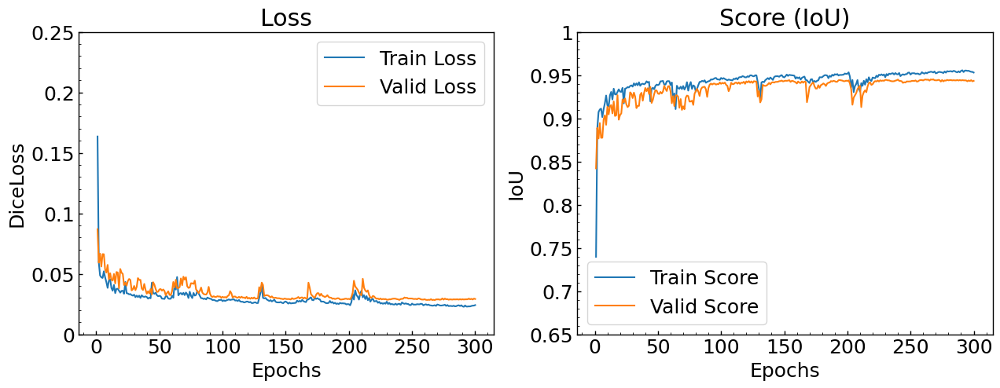

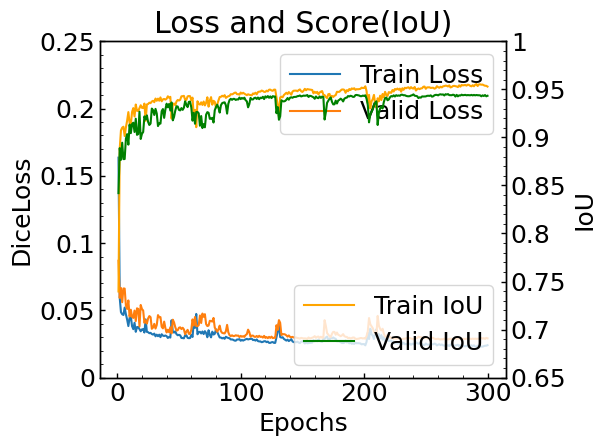

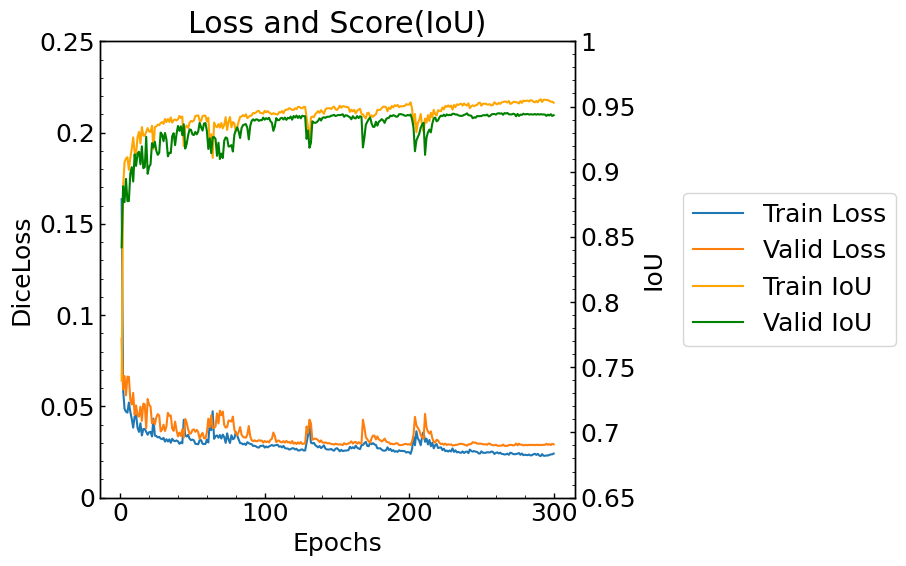

In [7]:
# # 数値の配列を文字列にして返す関数
# def convert_list_el_to_str_from_num(arr_num, num_decimals = 0):
#     arr_str = []
#     for num in arr_num:
#         if num_decimals == 0:
#             stg = str(num)
#         else:
#             stg = str(math.floor(num * 10 ** num_decimals) / (10 ** num_decimals))
#             while True:
#                 if not(stg[-1] in ["0", "."]):
#                     break
#                 elif stg == "0.0":
#                     stg = "0"
#                 else:
#                     stg = stg[:-1]

#         arr_str.append(stg)
#     return arr_str


def convert_list_el_to_str_from_num(arr_num, num_decimals=0):
    print(arr_num)
    arr_str = []
    for num in arr_num:
        if num_decimals == 0:
            stg = str(num)
        else:
            num_foor = math.floor(num * 10**num_decimals) / (10**num_decimals)
            print("num_foor:" + str(num_foor))
            stg = str(num_foor)
            print("stg:" + stg)
            while True:
                if not (stg[-1] in ["0", "."]):
                    break
                elif stg == "0.0":
                    stg = "0"
                    break
                else:
                    stg = stg[:-1]
                # pdb.set_trace()

        print("append:" + stg)
        arr_str.append(stg)
    return arr_str


plt.figure(1)
plt.figure(figsize=(15, 5))
# sns.set_style(style="darkgrid")

if const.NUM_EPOCHS < 20:
    arange_num = np.arange(1, const.NUM_EPOCHS + 1, step=1)
    arange_str = convert_list_el_to_str_from_num(arange_num)

    plt.xticks(arange_num, arange_str)
    plt.xlim(1, const.NUM_EPOCHS)
elif const.NUM_EPOCHS < 60:
    plt.xticks(np.arange(1, const.NUM_EPOCHS + 1, step=5))
    plt.xlim(0, const.NUM_EPOCHS)
else:
    plt.xticks(np.arange(1, const.NUM_EPOCHS + 1, step=10))
    plt.xlim(0, const.NUM_EPOCHS)


plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["xtick.direction"] = "in"
plt.rcParams["ytick.direction"] = "in"
plt.rcParams["xtick.major.width"] = 1.0
plt.rcParams["ytick.major.width"] = 1.0
plt.rcParams["font.size"] = 18
plt.rcParams["axes.linewidth"] = 1.0


plt.subplot(1, 2, 1)
arange_num = np.arange(0, 0.25 + 0.01, step=0.05)
# arange_str = convert_list_el_to_str_from_num(arange_num, 0)
# めんどくさいから自分で指定
arange_str = ["0", "0.05", "0.1", "0.15", "0.2", "0.25"]
plt.yticks(arange_num, arange_str)
plt.ylim(0, 0.25)
plt.minorticks_on()
sns.lineplot(x=range(1, const.NUM_EPOCHS + 1), y=total_train_loss, label="Train Loss")
sns.lineplot(x=range(1, const.NUM_EPOCHS + 1), y=total_valid_loss, label="Valid Loss")
plt.title("Loss")
plt.xlabel("Epochs")
plt.ylabel("DiceLoss")


plt.subplot(1, 2, 2)
arange_num = np.arange(0.65, 1 + 0.01, step=0.05)
# arange_str = convert_list_el_to_str_from_num(arange_num, 2)
arange_str = ["0.65", "0.7", "0.75", "0.8", "0.85", "0.9", "0.95", "1"]
# print(arange_str)
plt.yticks(arange_num, arange_str)
plt.ylim(0.65, 1)
plt.minorticks_on()
sns.lineplot(x=range(1, const.NUM_EPOCHS + 1), y=total_train_score, label="Train Score")
sns.lineplot(x=range(1, const.NUM_EPOCHS + 1), y=total_valid_score, label="Valid Score")
plt.title("Score (IoU)")
plt.xlabel("Epochs")
plt.ylabel("IoU")
plt.show()


# y軸が2つで凡例がグラフ中にあるにあるグラフ
fig, ax1 = plt.subplots()

# サブプロットの間隔を調整
plt.subplots_adjust(right=0.8)

arange_num_loss = np.arange(0, 0.25 + 0.01, step=0.05)
arange_str_loss = ["0", "0.05", "0.1", "0.15", "0.2", "0.25"]
ax1.set_yticks(arange_num_loss, arange_str_loss)
ax1.set_ylim(0, 0.25)
ax1.minorticks_on()
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1), y=total_train_loss, ax=ax1, label="Train Loss"
)
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1), y=total_valid_loss, ax=ax1, label="Valid Loss"
)
ax1.set_title("Loss and Score(IoU)")
ax1.set_xlabel("Epochs")
ax1.set_ylabel("DiceLoss")

ax2 = ax1.twinx()
arange_num_iou = np.arange(0.65, 1 + 0.01, step=0.05)
arange_str_iou = ["0.65", "0.7", "0.75", "0.8", "0.85", "0.9", "0.95", "1"]
ax2.set_yticks(arange_num_iou, arange_str_iou)
ax2.set_ylim(0.65, 1)
ax2.minorticks_on()
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1),
    y=total_train_score,
    ax=ax2,
    label="Train IoU",
    color="orange",
)
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1),
    y=total_valid_score,
    ax=ax2,
    label="Valid IoU",
    color="green",
)
ax2.set_ylabel("IoU")

plt.tight_layout()
plt.xlabel("Epochs")
plt.show()


# y軸が2つで凡例がグラフ外にあるグラフ
fig, ax1 = plt.subplots(figsize=(10, 6))

# 損失のy軸目盛り設定
arange_num_loss = np.arange(0, 0.25 + 0.01, step=0.05)
arange_str_loss = ["0", "0.05", "0.1", "0.15", "0.2", "0.25"]
ax1.set_yticks(arange_num_loss, arange_str_loss)
ax1.set_ylim(0, 0.25)
ax1.minorticks_on()
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1), y=total_train_loss, ax=ax1, label="Train Loss"
)
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1), y=total_valid_loss, ax=ax1, label="Valid Loss"
)
ax1.set_title("Loss and Score(IoU)")
ax1.set_xlabel("Epochs")
ax1.set_ylabel("DiceLoss")

# IoUのy軸目盛り設定
ax2 = ax1.twinx()
arange_num_iou = np.arange(0.65, 1 + 0.01, step=0.05)
arange_str_iou = ["0.65", "0.7", "0.75", "0.8", "0.85", "0.9", "0.95", "1"]
ax2.set_yticks(arange_num_iou, arange_str_iou)
ax2.set_ylim(0.65, 1)
ax2.minorticks_on()
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1),
    y=total_train_score,
    ax=ax2,
    label="Train IoU",
    color="orange",
)
sns.lineplot(
    x=range(1, const.NUM_EPOCHS + 1),
    y=total_valid_score,
    ax=ax2,
    label="Valid IoU",
    color="green",
)
ax2.set_ylabel("IoU")

# 凡例を右側に移動
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(
    lines1 + lines2, labels1 + labels2, loc="center left", bbox_to_anchor=(1.2, 0.5)
)

ax2.get_legend().remove()

plt.tight_layout()
plt.xlabel("Epochs")
plt.show()

In [8]:
# bestmodelの読み込み
checkpoint = torch.load(const.CHECKPOINT_PATH_UNet + best_model_file)
model.load_state_dict(checkpoint["state_dict"])
optimizer.load_state_dict(checkpoint["optimizer"])
start_epoch = checkpoint["epoch"]
valid_loss_min = checkpoint["valid_loss_min"]

[59, 40, 0, 25, 29, 26]


/tmp/ipykernel_2205/257942239.py:15: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  data = torch.autograd.Variable(data, volatile=True).cuda()
/tmp/ipykernel_2205/257942239.py:16: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  mask = torch.autograd.Variable(mask, volatile=True).cuda()


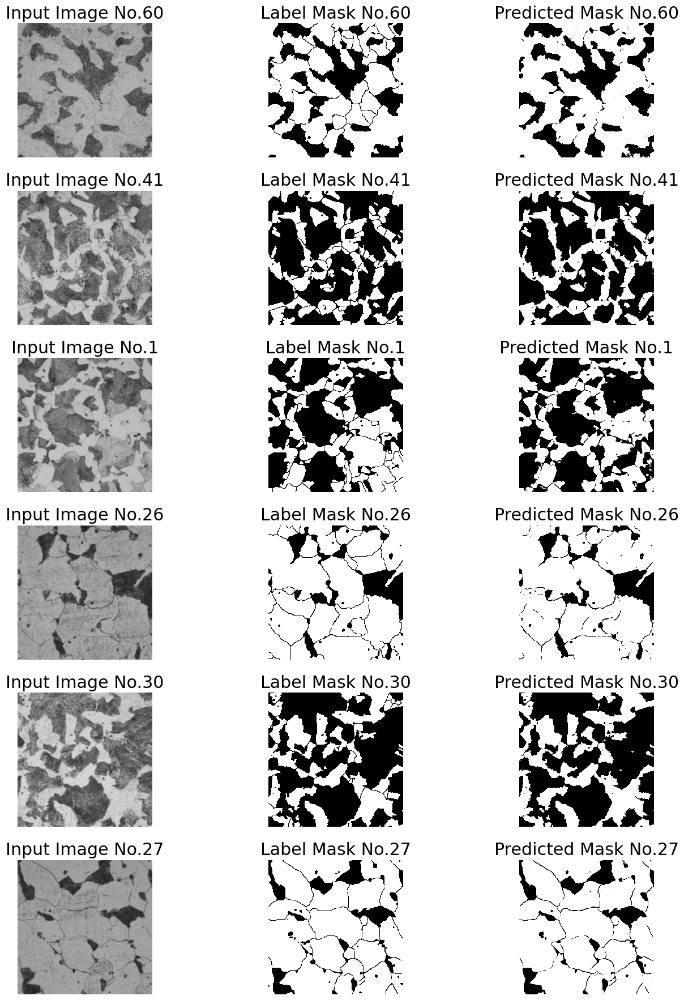

In [9]:
def visualize_predict(model, n_images, num_range):
    images = random.sample(range(0, num_range), n_images)
    print(images)
    figure, ax = plt.subplots(nrows=n_images, ncols=3, figsize=(15, 18))

    # now = datetime.now()
    # formatted_time = now.strftime("%Y%m%d%H%M")

    # output_directory = f"{const.APP_PATH}/tmp/{const.TRAIN_DIR}/{formatted_time}"
    # if not os.path.exists(output_directory):
    #     os.makedirs(output_directory)

    with torch.no_grad():
        for data, mask in val_loader:
            data = torch.autograd.Variable(data, volatile=True).cuda()
            mask = torch.autograd.Variable(mask, volatile=True).cuda()
            o = model(data)
            break
    for i in range(0, len(images)):
        img_no = images[i]
        tm = o[i][0].data.cpu().numpy()
        img = data[i].data.cpu().numpy()
        msk = mask[i].data.cpu().numpy()
        img = format_image(img)
        msk = format_mask(msk)
        ax[i, 0].imshow(img)
        ax[i, 1].imshow(msk, interpolation="nearest", cmap="gray")
        ax[i, 2].imshow(tm, interpolation="nearest", cmap="gray")
        ax[i, 0].set_title(f"Input Image No.{img_no+1}")
        ax[i, 1].set_title(f"Label Mask No.{img_no+1}")
        ax[i, 2].set_title(f"Predicted Mask No.{img_no+1}")
        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
        ax[i, 2].set_axis_off()
        # plt.imsave(f"{output_directory}/Input_Image_No_{img_no+1}.png", img)
        # plt.imsave(f"{output_directory}/Label_Mask_No_{img_no+1}.png", msk)
        # plt.imsave(f"{output_directory}/Predicted_Mask_No_{img_no+1}.png", tm)
    plt.tight_layout()
    plt.show()


visualize_predict(model, 6, num_range)

/tmp/ipykernel_2205/1379170779.py:15: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  data = torch.autograd.Variable(data, volatile=True).cuda()
/tmp/ipykernel_2205/1379170779.py:16: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  mask = torch.autograd.Variable(mask, volatile=True).cuda()


60


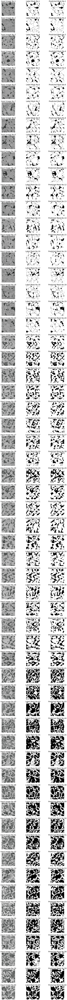

In [10]:
def visualize_full_predict(model):
    full_dataset = image_loader.LoadDataSet(
        setting.const.TRAIN_PATH,
        const.IMG_HEIGHT,
        const.IMG_WIDTH,
        transform=image_loader.get_train_transform(
            const.IMG_HEIGHT, const.IMG_WIDTH, horizontal_flip=0.0, vertical_flip=0.0
        ),
    )

    all_loader = DataLoader(dataset=full_dataset, batch_size=full_dataset.__len__())

    with torch.no_grad():
        for data, mask in all_loader:
            data = torch.autograd.Variable(data, volatile=True).cuda()
            mask = torch.autograd.Variable(mask, volatile=True).cuda()
            o = model(data)
            break

    n_images = len(data)
    print(n_images)
    figure, ax = plt.subplots(nrows=n_images, ncols=3, figsize=(15, 180))

    now = datetime.now()
    formatted_time = now.strftime("%Y%m%d%H%M")

    output_directory = f"{const.APP_PATH}/tmp/{const.TRAIN_DIR}/{formatted_time}"
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    for i in range(0, len(data)):
        img_no = i
        tm = o[i][0].data.cpu().numpy()
        img = data[i].data.cpu().numpy()
        msk = mask[i].data.cpu().numpy()
        img = format_image(img)
        msk = format_mask(msk)
        ax[i, 0].imshow(img)
        ax[i, 1].imshow(msk, interpolation="nearest", cmap="gray")
        ax[i, 2].imshow(tm, interpolation="nearest", cmap="gray")
        ax[i, 0].set_title(f"Input Image No.{img_no+1}")
        ax[i, 1].set_title(f"Label Mask No.{img_no+1}")
        ax[i, 2].set_title(f"Predicted Mask No.{img_no+1}")
        ax[i, 0].set_axis_off()
        ax[i, 1].set_axis_off()
        ax[i, 2].set_axis_off()
        plt.imsave(f"{output_directory}/Input_Image_No_{img_no+1}.png", img)
        plt.imsave(f"{output_directory}/Label_Mask_No_{img_no+1}.png", msk)
        plt.imsave(f"{output_directory}/Predicted_Mask_No_{img_no+1}.png", tm)
    plt.tight_layout()
    plt.show()


visualize_full_predict(model)